In [12]:
%matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np

import sys
from fastai.vision.all import *

sys.path.append("../PycastWorld")
sys.path.append("../Gym")
sys.path.append("../Notebooks")

from gym_pycastworld.PycastWorldEnv import PycastWorldEnv
from cmd_classes_funcs_Marchese import MyModel

In [13]:
# loading in trained NN
net = MyModel()
net.load_state_dict(torch.load('cmd_torch.pth'))

<All keys matched successfully>

In [14]:
steps_per_episode = 50

In [15]:
env = PycastWorldEnv()

In [16]:
# Grab the initial observation (not used here)
observation = env.reset()
frames = [observation.copy()]

In [17]:
# Variable to keep track of the previous move
prev_move = 1
# Variable to keep track of current move's name
action_name = 'straight'

tensor([[  94.4751,    8.6353, -178.2496]], grad_fn=<AddmmBackward>)
left 0
tensor([[ 116.6819,    8.2241, -197.1330]], grad_fn=<AddmmBackward>)
left 0
tensor([[ 101.0252,   14.3149, -185.2603]], grad_fn=<AddmmBackward>)
left 0
tensor([[ 108.6178,   17.7478, -199.1961]], grad_fn=<AddmmBackward>)
left 0
tensor([[  97.7281,   16.6210, -180.7771]], grad_fn=<AddmmBackward>)
left 0
tensor([[  92.0377,   14.2326, -161.6375]], grad_fn=<AddmmBackward>)
left 0
tensor([[  60.6068,   16.8031, -122.5892]], grad_fn=<AddmmBackward>)
left 0
tensor([[  47.3018,   16.1686, -107.5004]], grad_fn=<AddmmBackward>)
left 0
tensor([[ 38.3332,  13.8251, -95.0869]], grad_fn=<AddmmBackward>)
left 0
tensor([[ 35.1573,  13.4071, -90.2766]], grad_fn=<AddmmBackward>)
left 0
tensor([[ 29.9984,  13.1887, -82.7470]], grad_fn=<AddmmBackward>)
left 0
tensor([[ 27.7686,  13.4363, -78.1101]], grad_fn=<AddmmBackward>)
left 0
tensor([[ 27.3142,  13.5707, -76.3538]], grad_fn=<AddmmBackward>)
left 0
tensor([[ 30.2103,  15.1264

<IPython.core.display.Javascript object>


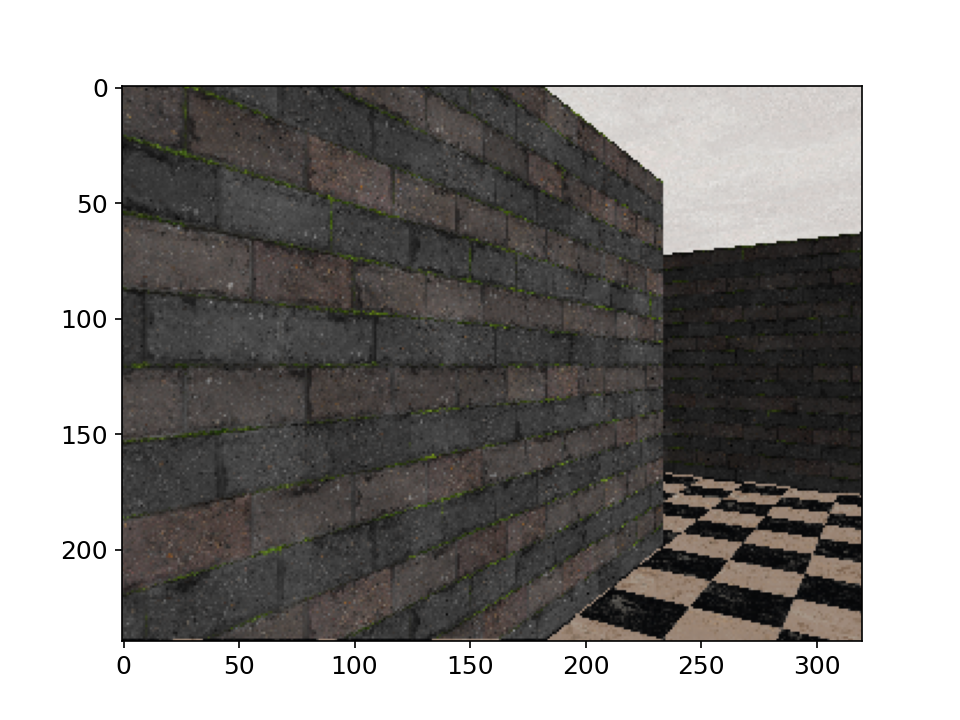

  Ended at position 3.5, 3.5


In [18]:
for t in range(steps_per_episode):

    # Remove this render call when actually training;
    # it will needlessly slow things down if you don't want
    # to watch.
    # TODO: cannot render on HPC
    # env.render()
    
    inp = (tensor(observation/255).permute(2,0,1).unsqueeze(0), tensor(prev_move).unsqueeze(0))
    # Use a trained neural network to select the action
    output = net(inp)
    
    # output is a multi-value tensor in order to know the action_index
    # we must take max and see what move is associated with that max
    
    # Getting the probability of the predicted most probable move
    print(output)
    prob = torch.max(output[0])
    action_index = int()
                
    # Looking at what move has that probability
    if prob == output[0][0]:
        action_index = 0
        action_name = 'left'
    elif prob == output[0][1]:
        # Must account for differing move indexing
        # Model sees 'right' as index 1 and 'straight' as index 2;
        # this needs to be flipped
        action_index = 2
        action_name = 'right'
    else:
        action_index = 1
        action_name = 'straight'

    # Update previous move
    prev_move = action_index
    
    print(action_name + " " + str(action_index))

    # Advance the world one step. We could also have the step
    # method advance more than step so that it takes fewer
    # steps in total to get to the end goal.
    observation, reward, done, info = env.step(action_index)
    frames.append(observation.copy())
    # Check if we reached the end goal
    if done:
        print(f"  Found goal in {t+1} steps")
        break
        
plt.imshow(observation)
print(f"  Ended at position {env.world.getX()}, {env.world.getY()}")
env.close()

In [9]:
plt.imshow(frames[0])

In [10]:
# TODO: matplotlib animation
# https://matplotlib.org/stable/api/animation_api.html
fig, ax = plt.subplots()
ax.set(xlim=(0,300), ylim=(240,0))

frame = plt.imshow(frames[0])
print(f"  Ended at position {env.world.getX()}, {env.world.getY()}")

def init():
    frame.set_data(frames[0])
    return [frame]

def animate(i):
    frame.set_array(i)
    return [frame]

<IPython.core.display.Javascript object>

  Ended at position 3.5, 3.5


In [11]:
from IPython.display import HTML

ani = FuncAnimation(fig, animate, frames[::2], init_func = init, interval = 20)
ani.save("prediction" + ".gif")
HTML(ani.to_jshtml())

MovieWriter ffmpeg unavailable; using Pillow instead.
